# **Qs 1: [2 Marks] Implement the Harris algorithm using OpenCV:**

**Introduction:**
In this report, we discuss the implementation of the Harris corner detection algorithm using OpenCV, a popular computer vision library in Python. The Harris corner detection algorithm is widely used for detecting corners in images.

Corner points are crucial features that provide significant information about the structure of an image. Corners are points in an image where there are significant variations in intensity in all directions. These points are essential in various computer vision tasks like feature matching, object recognition, and image stitching.

**Algorithm Overview:**
The Harris corner detection algorithm works by computing the Harris response for each pixel in the image. The Harris response is a measure of corner-like structures in the local neighborhood of a pixel. High Harris responses indicate the presence of a corner. The algorithm involves the following key steps:

a) **Conversion to Grayscale:**
The input image is first converted to grayscale. Grayscale conversion simplifies the computation by reducing the image to a single-channel representation.

b) **Gradient Calculation:**
The horizontal and vertical gradients (dx and dy) of the grayscale image are computed using the Sobel operator. These gradients represent the changes in intensity in the x and y directions.

c) **Harris Response Calculation:**
Using the gradients, the algorithm calculates the Harris response for each pixel using the formulas provided in the algorithm. The Harris response is based on the second moment matrix of the gradients.

d) **Non-Maximum Suppression and Thresholding:**
To obtain accurate corner points, non-maximum suppression is performed to keep only local maxima as potential corners. Additionally, a threshold is applied to filter out weak corner responses, as very small responses may not correspond to meaningful corners.



##### **1. Import the necessary libraries:**
Here, i import the OpenCV library with the alias cv2. This library provides various computer vision functionalities, including corner detection using the Harris algorithm.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

##### **2. Load the image:**
The code reads the input image in grayscale mode (cv2.IMREAD_GRAYSCALE). It's essential to convert the image to grayscale because the Harris corner detection algorithm works on single-channel images.

In [ ]:
image = cv2.imread('/content/426142-1669896521.jpg', cv2.IMREAD_GRAYSCALE)

**3.Define parameters for the Harris algorithm:**

Here, i have defined the parameters for the Harris corner detection algorithm:

**block_size:** The size of the neighborhood considered for corner detection. It represents the size of the kernel window.

**ksize:** The aperture size for the Sobel operator, which calculates gradients in the x and y directions.

**k:** The Harris detector free parameter, which typically lies in the range [0.04, 0.06]. It influences the sensitivity of corner detection.

**threshold:** A threshold value to filter out weak corner responses. Corners with Harris responses greater than threshold * max_response will be considered as corners.

In [ ]:
block_size = 2  # Neighborhood size for corner detection
ksize = 3       # Aperture parameter for the Sobel operator
k = 0.04        # Harris detector free parameter (typically in the range [0.04, 0.06])
threshold = 0.01  # Threshold to filter out weak corners

###### **4. Perform Harris corner detection:**


In [ ]:
harris_corners = cv2.cornerHarris(image, block_size, ksize, k)

**5. Dilate the corners to mark them:**

In this step, we use the cv2.cornerHarris() function to compute the Harris response for each pixel in the image. The function takes the grayscale image (image) and the previously defined parameters (block_size, ksize, and k) as inputs. It returns a 2D array representing the Harris response for each pixel.

In [ ]:
# Post-processing:
harris_corners = cv2.dilate(harris_corners, None)

Since the Harris corner response is typically quite sparse, it is common to perform a dilation operation to enhance the corner points and make them more visible.

**6. Threshold the corner response to filter out weak corners:**

In [ ]:
image[harris_corners > threshold * harris_corners.max()] = 255

**7. Display the result:**

Here, i apply thresholding to filter out weak corner responses. I set the pixel values in the original grayscale image to 255 (white) at positions where the Harris response is greater than the threshold value multiplied by the maximum response. This highlights the detected corners in the output image.

Finally, I use cv2_imshow() to display the result image, and cv2.waitKey(0) waits for a key press before closing the window with cv2.destroyAllWindows().

**Conclusion:**
This code implements the Harris corner detection algorithm using OpenCV in a concise manner. The algorithm effectively identifies corner points in the input image by computing the Harris response and applying thresholding to enhance the detected corners. The resulting image highlights the corners in white against a black background, making them easily visible.






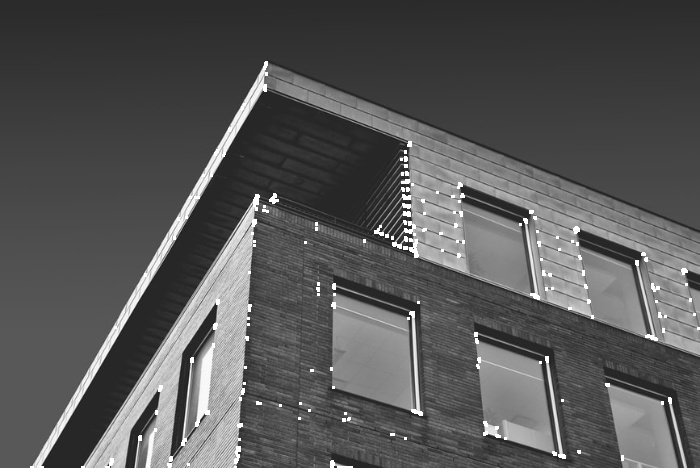

In [ ]:
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Qs 2: [2 Marks] Implement Image Pyramid using OpenCV.**

**Introduction:**
The Image Pyramid is a powerful technique used in computer vision and image processing to create multi-scale representations of an image. It involves repeatedly downsampling the original image to generate a series of lower-resolution versions, known as layers. Each layer of the pyramid provides a different scale of the original image, and these pyramids are widely used in various applications, such as object detection, image blending, and feature extraction.

In this report, i will explain the code provided, which implements the Image Pyramid using OpenCV and visualizes it using Matplotlib in Python.


**Step 1:** In the first step, the necessary libraries are imported. The code uses OpenCV (cv2) for image processing and Matplotlib (plt) for displaying the image pyramid.

**Step 2**: The code reads an image from the specified path and stores it in the variable img using the cv2.imread() function.

**Step 3:** Here, the variable layer is initialized as a copy of the original image. This variable will be used to store the current layer of the image pyramid during the loop.

**Step 4:** In this loop, the image pyramid is generated using the cv2.pyrDown() function, which downsamples the current layer by half along both the x and y axes. The loop runs four times (range(4)), creating four layers in total.

Each iteration, the current layer is displayed using plt.imshow() from Matplotlib and cv2_imshow() from OpenCV. This displays the current layer in the pyramid, and the loop pauses until a key is pressed (using cv2.waitKey(0)) to proceed to the next iteration.

In this implementation, we use the cv2.pyrDown function to create the image pyramid. The function applies a Gaussian smoothing filter and then downsamples the image, effectively reducing its size by half in both width and height. The loop continues until the image's width or height becomes less than 30 pixels, but you can adjust this threshold based on your specific needs.


1. **Import Libraries**: I started by importing the necessary library, which is OpenCV (`cv2`). OpenCV is a popular computer vision library that provides various functions for image processing and manipulation.

2. **Read the Image**: In this step, the image is read in BGR format (Blue, Green, Red) by default.

3. **Initialize the Pyramid List**: I created an empty list called `pyramid`. This list will be used to store the levels of the image pyramid that will be generated. I start with the original image as the first level of the pyramid.

4. **Create the Image Pyramid**:
   - The `while` loop is used to create the image pyramid. The loop continues until the resized image's width or height becomes less than 30 pixels. This ensures that stop creating pyramid levels when the image becomes too small.
   - In each iteration of the loop, I use `cv2.pyrDown()` to resize the last image in the `pyramid` list. This function applies a Gaussian blur on the image to reduce noise and then downsamples it by a factor of 2 in both width and height. This results in a smaller version of the previous image, which becomes the next level in the pyramid.
   - The resized image is then appended to the `pyramid` list. In the code, it keeps creating smaller versions of the original image until the stopping condition is met.

5. **Display the Image Pyramid**:
   - After creating the pyramid, i  visualize it to understand how the image scales down at each level.
   -  A `for` loop to iterate through each level in the `pyramid` list is then implemented
   - For each level, i use `cv2_imshow()` to display the image in a separate window. The title of each window is set to "Level i", where `i` is the index of the current level. This helps identify which level we are looking at.
   - The `cv2_imshow()` function displays the image in a window on the screen.

###**Conlcusion:**

 Each level in the pyramid represents a different scale of the original image, and this multi-scale representation can be useful for various computer vision tasks like feature extraction, object detection, and image processing at different resolutions.

**Conclusion:**
In conclusion, the provided code demonstrates the implementation of an Image Pyramid using OpenCV and visualizing the pyramid using Matplotlib. The resulting image pyramid consists of multiple layers, each representing a lower resolution version of the original image. Each layer is displayed one after the other, creating a visual representation of the image at different scales. The simplicity and effectiveness of this code make it a valuable tool for various computer vision applications that require multi-scale analysis of images

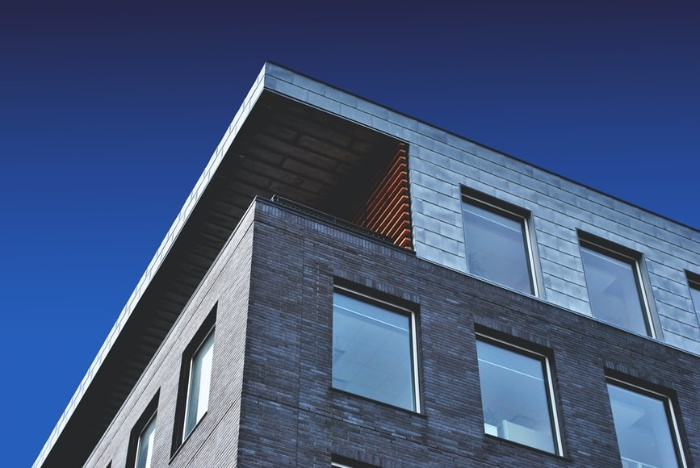

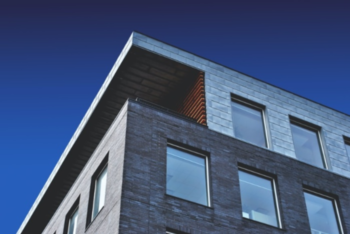

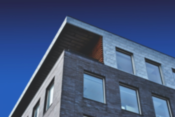

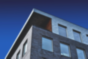

In [ ]:
import cv2

# Read the image
p_image = cv2.imread('/content/426142-1669896521.jpg')

# Create the image pyramid
pyramid = [p_image]  # Initialize the list with the original image

while True:
    # Resize the image to half of its dimensions
    resized_image = cv2.pyrDown(pyramid[-1])

    # Break the loop when the image's width or height becomes less than 30 pixels
    if resized_image.shape[0] < 30 or resized_image.shape[1] < 30:
        break

    # Append the resized image to the pyramid list
    pyramid.append(resized_image)

# Display the image pyramid
for i, level in enumerate(pyramid):
    cv2_imshow(level)

cv2.waitKey(0)
cv2.destroyAllWindows()


# **Qs 3: [3 Marks] Implement Image Segmentation with Watershed Algorithm using OpenCV:**



The provided code is an implementation of the Watershed algorithm for image segmentation using OpenCV. Image segmentation is the process of partitioning an image into multiple segments or regions based on certain criteria. The Watershed algorithm is particularly useful for segmenting objects in an image when there are clear boundaries between the objects and the background. Let's break down the code step-by-step and explain it for the report:

1. **Load and Preprocess the Image:**
   The code starts by loading an image from the specified path using `cv2.imread()`. The image is then converted to grayscale using `cv2.cvtColor()` with the flag `cv2.COLOR_BGR2GRAY`. Grayscale images are easier to work with for segmentation tasks.

2. **Apply Thresholding to Create Binary Image:**
   The code applies thresholding to the grayscale image using `cv2.threshold()`. Thresholding is a technique to convert grayscale images into binary images, where pixels are classified as either foreground (object) or background based on a specified threshold value. The `cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU` parameters use Otsu's method to automatically determine an optimal threshold.

3. **Clean Up the Binary Image:**
   Morphological operations are performed on the binary image to remove noise and enhance the shape of the objects. The `cv2.morphologyEx()` function is used with `cv2.MORPH_OPEN` to perform opening, which is an erosion followed by dilation. This helps remove small noise regions and smooth the boundaries.

4. **Identify Background and Foreground Regions:**
   The code uses distance transformation (`cv2.distanceTransform()`) to identify the foreground regions based on the distance from the background. The thresholding with `0.7 * dist_transform.max()` is applied to separate the foreground from the background.

5. **Marker Labeling and Watershed Algorithm:**
   The connected components labeling (`cv2.connectedComponents()`) is used to label the foreground regions. The marker values are incremented to ensure the background is not labeled as 0, but as 1. The region of unknown (uncertain segmentation) is marked as 0. Then, the Watershed algorithm is applied using `cv2.watershed()` with the original color image and the markers to segment the image into distinct regions.

6. **Display the Segmented Image:**
   Finally, the code marks the boundary of the segmented regions with red color (0, 0, 255) using the condition `image[markers == -1] = [0, 0, 255]`. The segmented image is then displayed using `cv2_imshow()`.

 The process involves converting the image to grayscale, applying thresholding to create a binary image, and using morphological operations to clean up the binary image. Then, the algorithm identifies background and foreground regions, labels them using connected components, and applies the Watershed algorithm to segment the image. The output is a segmented image with distinct regions marked by different colors.

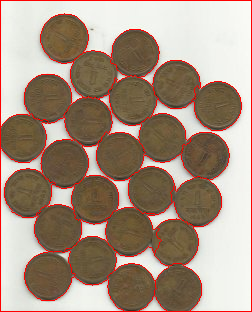

In [ ]:
import cv2
import numpy as np

def main():
    # Load the image
    image_path = '/content/water_coins.jpg'
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to create a binary image
    _, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Perform morphological operations to clean up the binary image
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Identify background and foreground regions
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker labeling
    _, markers = cv2.connectedComponents(sure_fg)

    # Increment the marker values to ensure the background is not 0, but 1
    markers = markers + 1

    # Mark the region of unknown with 0
    markers[unknown == 255] = 0

    # Apply the Watershed algorithm
    markers = cv2.watershed(image, markers)
    image[markers == -1] = [0, 0, 255]  # Mark the boundary with red color

    # Display the segmented image
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

if __name__ == '__main__':
    main()

# **Qs 4: [3 Marks] Implement SIFT algorithm using OpenCV:**

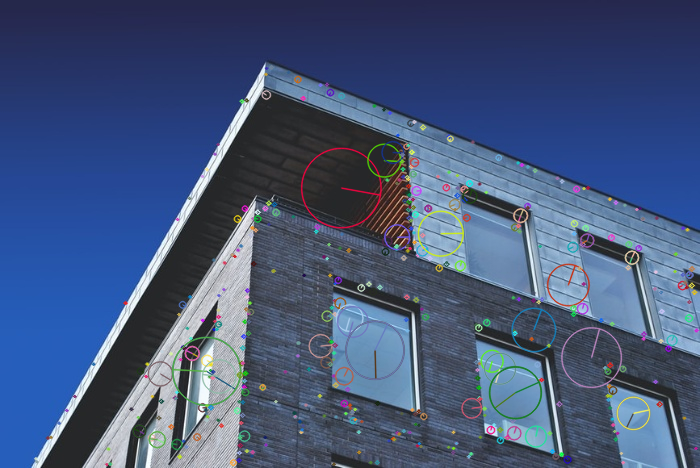

In [ ]:
import cv2

def main():
    # Load the image
    image_path = '/content/426142-1669896521.jpg'  # Replace with the actual path to your image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Initialize the SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)

    # Draw keypoints on the image
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display the image with keypoints
    cv2_imshow(image_with_keypoints)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

if __name__ == '__main__':
    main()


  ### **Qs 5: [5 Marks] Implement object detection using YOLO on the COCO dataset. Provide the results for any 5 images (for testing purposes) from the dataset:**
  1. **Step 1:**
 The general code demonstrates how to use the YOLOv3 model and COCO class labels to perform object detection on a set of test images. The bounding boxes drawn around the detected objects help visualize the model's performance in identifying different objects present in the images.

2. **Step 2:**
In the first setep, the code imports the necessary libraries: cv2 (OpenCV) for computer vision tasks and numpy for numerical operations on arrays. This step loads the YOLO model by reading the pre-trained weights and configuration file. The YOLOv3 model is a deep neural network designed for object detection. The cv2.dnn.readNet function loads the model from the specified paths.

3. **Step 3:**
In the next step, the code loads the class labels for the COCO dataset. The COCO dataset contains a wide range of objects, and each object class is represented by a unique name (e.g., "person," "car," "dog," etc.).
4. **Step 4**
NEXT, I have sets up the output layers of the YOLO model. YOLOv3 has three output layers, and the code extracts them using getUnconnectedOutLayers(). These output layers are important for obtaining the detected objects' bounding boxes and their associated confidences during the inference process.

5. **Step 5:**
The next part, defines a function detect_objects, which performs object detection on a given image using the loaded YOLO model and the COCO class labels. The function takes the path to the image as input and returns the image with bounding boxes drawn around the detected objects.

6. **Step 6:**
Finally the code executes object detection on multiple test images specified in the image_paths list.

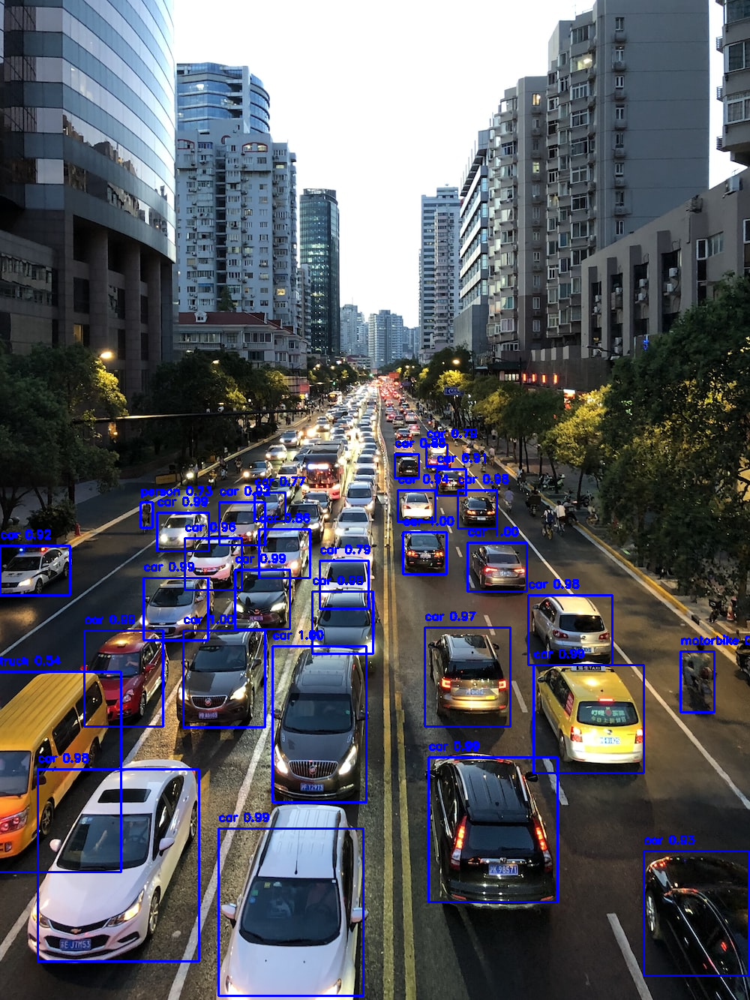

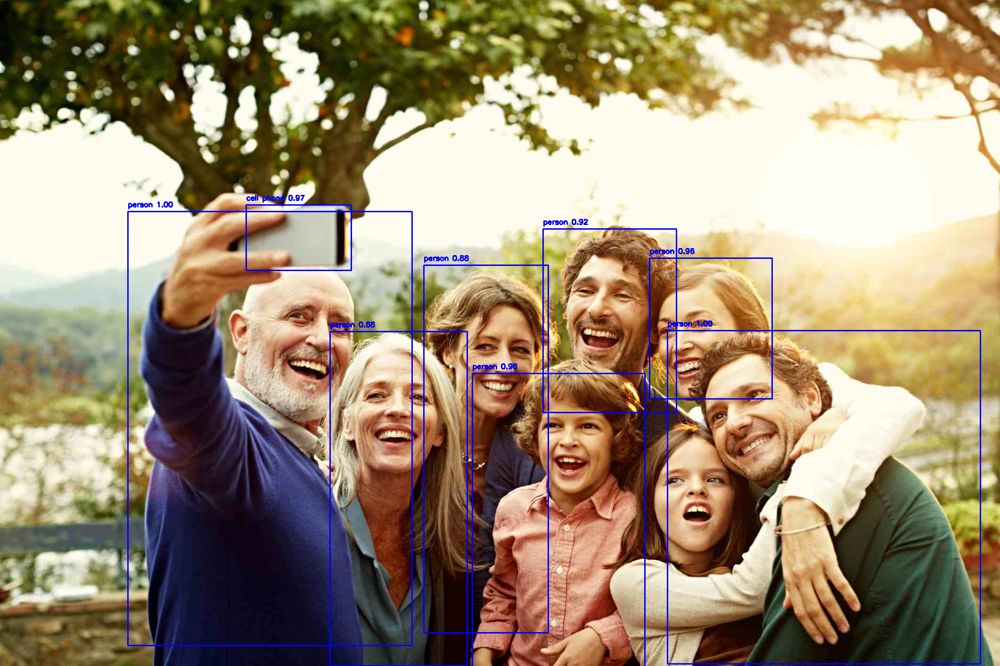

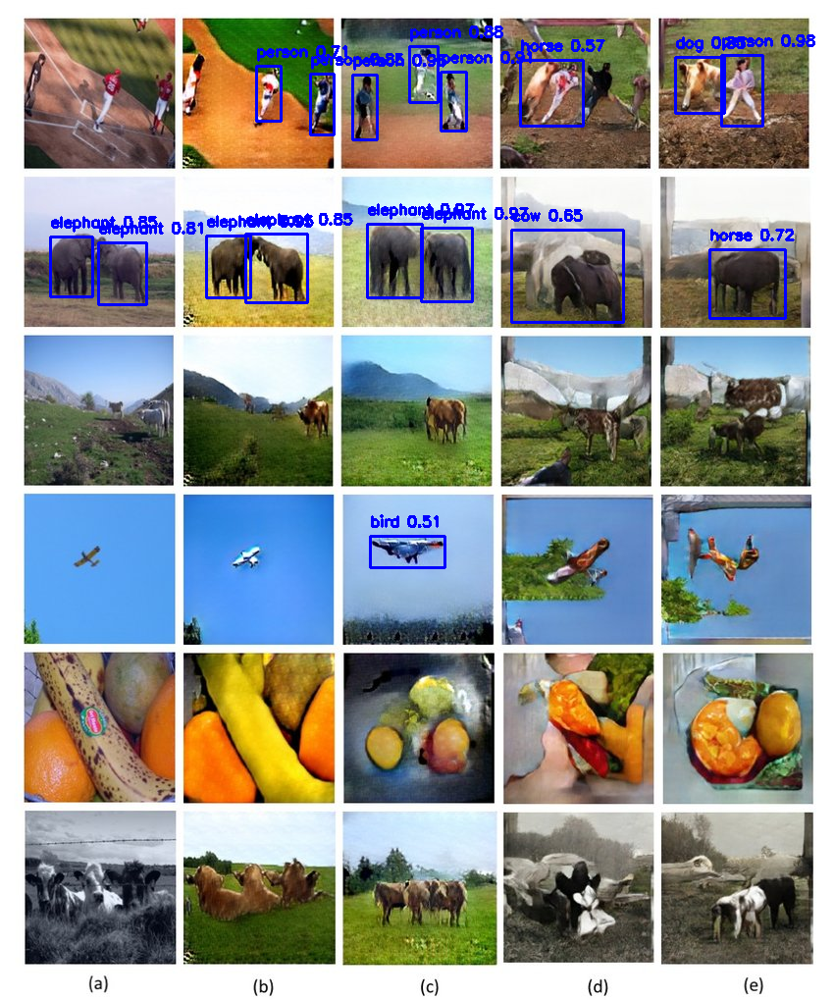

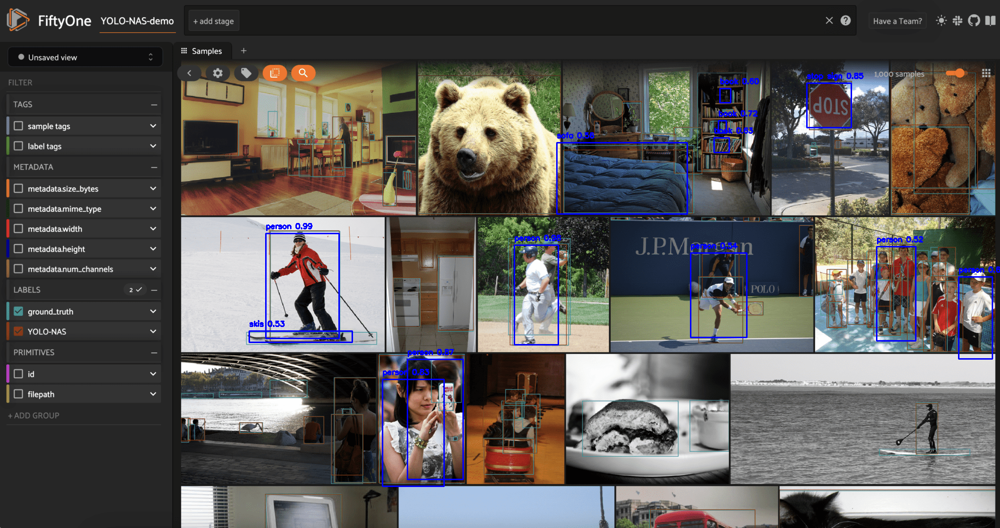

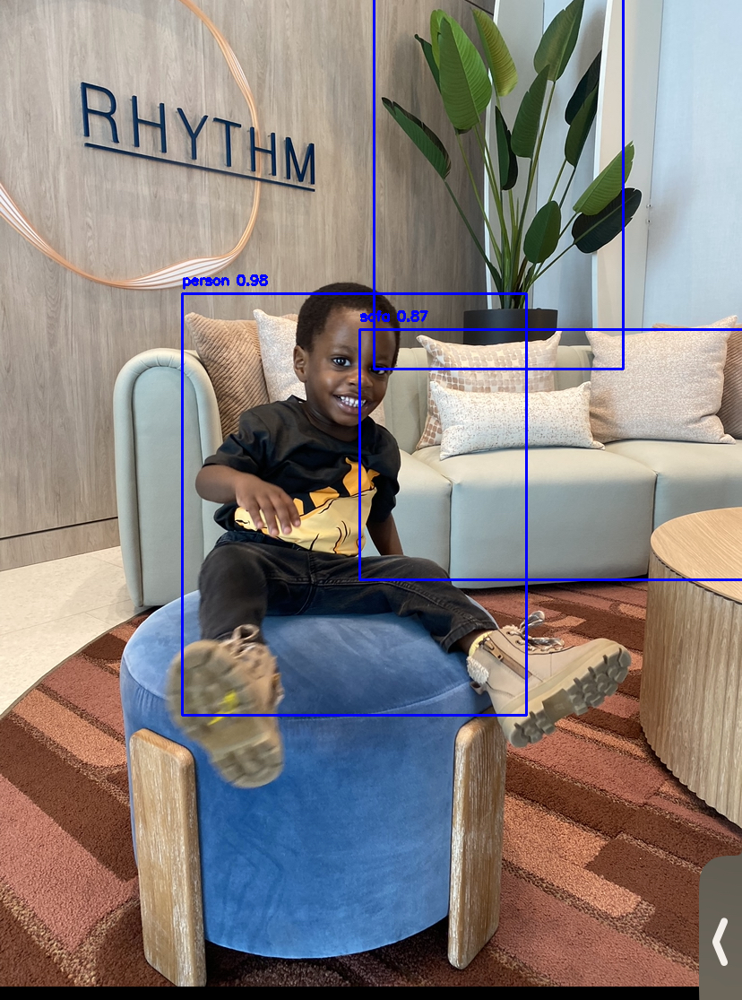

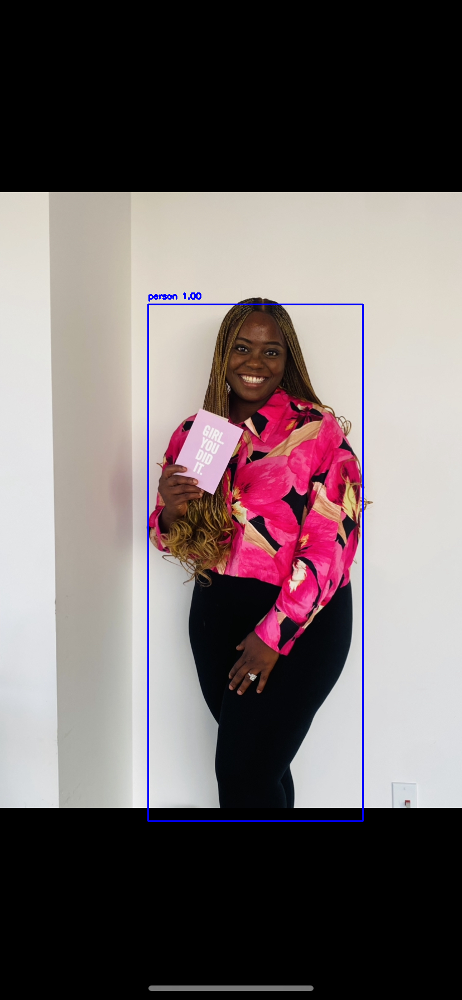

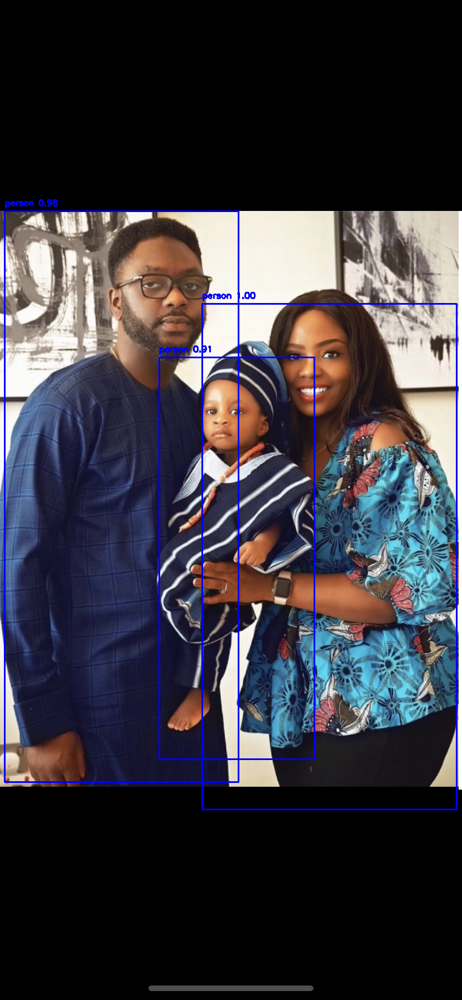

In [ ]:
import cv2
import numpy as np

# Step 1: Load YOLO Model
net = cv2.dnn.readNet("/content/yolov3.weights", "/content/yolov3.cfg")

# Step 2: Load COCO Labels
classes = []
with open("/content/coco.namess.txt", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Step 3: Set up YOLO Parameters
layer_names = net.getLayerNames()
#output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
output_layers = [
                layer_names[net.getUnconnectedOutLayers()[0]-1],
                 layer_names[net.getUnconnectedOutLayers()[1]-1],
                 layer_names[net.getUnconnectedOutLayers()[2]-1]
                ]

# Step 4: Function to Perform Object Detection
def detect_objects(image_path):
    img = cv2.imread(image_path)
    height, width, channels = img.shape

    # Prepare the image for YOLO model
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Process the output and draw bounding boxes
    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]

            if confidence > 0.5:  # Change the confidence threshold if needed
                # YOLO returns the center coordinates, width, and height, so we need to convert them to coordinates
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Calculate the top-left corner coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    # Apply non-maximum suppression to eliminate redundant overlapping boxes
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    # Draw bounding boxes on the image
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            confidence = confidences[i]
            color = (255, 0, 0)  # BGR color format
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
            cv2.putText(img, f"{label} {confidence:.2f}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Show the image with bounding boxes
    cv2_imshow(img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Step 5: Perform Object Detection on Test Images
# Replace "test_image1.jpg", "test_image2.jpg", ... with your test image paths
image_paths = ["/content/traffic.jpeg", "/content/happy-family.jpg","/content/yolo_Selected-generation-results-on-the-COCO-Stuff-dataset-at-256-256-resolution-Here-the.png","/content/yolonas_fo_full_dataset-2048x1082.png", "/content/IMG_456B10EB11A2-1.jpeg","/content/IMG_4722C7EF4E69-1.jpeg","/content/IMG_C30AC4C43EA5-1.jpeg"]
for image_path in image_paths:
    detect_objects(image_path)
